## Set Up Environment, Read Data, Split Train/Test Sets

In [ ]:
!pip install --upgrade pip
!pip install --upgrade -q wandb
!pip install catboost
!pip install optuna
!pip install eli5
!pip install shap
import os
import random
import numpy as np
import warnings
import pandas as pd
from sklearn.model_selection import cross_val_score, KFold
import joblib
from catboost import CatBoostRegressor
import optuna
from optuna import Trial
optuna.logging.set_verbosity(optuna.logging.WARNING) 
import wandb
from optuna.integration.wandb import WeightsAndBiasesCallback
from datetime import datetime, timedelta
from timeit import default_timer as timer
import time 
import pickle
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import plotly.offline as py
import matplotlib.pyplot as plt
import seaborn as sns
import eli5 
from eli5.sklearn import PermutationImportance 
import webbrowser
from eli5.formatters import format_as_dataframe
import shap
warnings.filterwarnings('ignore')
my_dpi = 96
print('\n')
!nvidia-smi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 MB 21.7 MB/s eta 0:00:0000:0100:01


Wed Dec 28 01:17:33 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.73.05    Driver Version: 510.73.05    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA RTX A4000    Off  | 00000000:00:05.0 Off |                  Off |
| 60%   77C    P2    69W / 140W |    995MiB / 16376MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+-------------------

In [ ]:
# Set seed 
seed_value = 42
os.environ['UsedCarsCarGurus_CatboostGPU'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)

In [ ]:
%cd /notebooks/UsedCarsCarGurus/Data/

/notebooks/UsedCarsCarGurus/Data


In [ ]:
# Read data 
trainDF = pd.read_csv('usedCars_trainSet.csv', low_memory=False)
testDF = pd.read_csv('usedCars_testSet.csv', low_memory=False)

# Define label and features
train_label = trainDF[['price']]
test_label = testDF[['price']]

train_features = trainDF.drop(columns = ['price'])
test_features = testDF.drop(columns = ['price'])

# Set categorical variables for Catboost
categorical_features_indices = np.where(train_features.dtypes != np.float)[0]

## 100 Trials 10-Fold Cross Validation

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_PKL

/notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_PKL


In [ ]:
# Set up wandb
wandb.login()

wandb_kwargs = {'project': 'usedCars_hpo', 'entity': 'aschultz', 
                'group': 'optuna_cat100gpu_cv_kfold10', 
                'save_code': 'False', 'notes': 'optuna_cat100gpu_cv_kfold10'}
wandbc = WeightsAndBiasesCallback(wandb_kwargs=wandb_kwargs, as_multirun=True)

wandb: Currently logged in as: aschultz. Use `wandb login --relogin` to force relogin


In [ ]:
# Set same k-folds for reproducibility
kfolds = KFold(n_splits=10, shuffle=True, random_state=seed_value)

# Set up WB callbacks
@wandbc.track_in_wandb()

# Define a function for optimization of hyperparameters
def objective(trial):
    """
    Objective function to tune a `CatBoostRegressor` model.
    """
    joblib.dump(study, 'Cat_Optuna_100_GPU_wb_CV.pkl')

# Define parameter grid
    catboost_tune_kwargs = {
        'random_state': seed_value,
        'task_type':'GPU',
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 0.3),       
        'depth': trial.suggest_int('depth', 3, 10),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-2, 1e0),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 2, 20),
        'one_hot_max_size': trial.suggest_int('one_hot_max_size', 2, 20), 
        'boosting_type': trial.suggest_categorical('boosting_type', 
                                                   ['Ordered', 'Plain']),
        'bootstrap_type': trial.suggest_categorical('bootstrap_type', 
                                                    ['Bayesian', 'Bernoulli', 
                                                     'MVS'])
        }   

    # Conditional Hyperparameters
    if catboost_tune_kwargs['bootstrap_type'] == 'Bayesian':
      catboost_tune_kwargs['bagging_temperature'] = trial.suggest_float('bagging_temperature', 
                                                                        0, 10)
    elif catboost_tune_kwargs['bootstrap_type'] == 'Bernoulli':
      catboost_tune_kwargs['subsample'] = trial.suggest_float('subsample', 0.1, 1)
    
    # Define model type
    model = CatBoostRegressor(
        loss_function='RMSE', 
        cat_features=categorical_features_indices,
        early_stopping_rounds=10,
        rsm=1, 
        logging_level='Silent',
        **catboost_tune_kwargs)

    # Start timer for each trial
    start = timer()    
    
    # Perform k_folds cross validation to find lower error
    scores = -cross_val_score(model, train_features, train_label, 
                              scoring='neg_root_mean_squared_error', 
                              cv=kfolds)
    run_time = timer() - start

    # Extract best score
    rmse = np.mean(scores)
    print('- Trial RMSE:', rmse)  
    
    return rmse

In [ ]:
# Begin HPO trials 
# Start timer for experiment
start_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
if os.path.isfile('Cat_Optuna_100_GPU_wb_CV.pkl'):
    study = joblib.load('Cat_Optuna_100_GPU_wb_CV.pkl')
else:
    study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, callbacks=[wandbc])

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)
wandb.finish()

Start Time           2022-12-27 02:53:23.485216


- Trial RMSE: 7780.620488276198


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,3.0018
boosting_type,Plain


- Trial RMSE: 9026.948774065026


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,MVS
depth,4


- Trial RMSE: 2969.993000575147


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,6


- Trial RMSE: 5481.28198518633


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,8.22048
boosting_type,Plain


- Trial RMSE: 9513.469462020217


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 9566.24990814044


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,3


- Trial RMSE: 9109.537165135309


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,3.78674
boosting_type,Plain


- Trial RMSE: 2852.1163610630633


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 4061.6169957414663


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,1.21482
boosting_type,Ordered


- Trial RMSE: 9568.96773232004


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,3


- Trial RMSE: 4075.797339863784


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2704.2143201432805


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 3443.7202104927355


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2576.2752041864815


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2651.754069687221


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2947.819424473006


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2688.4657991676195


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2680.3458396641972


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 3704.431680755003


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 3569.9275173122105


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2975.7238325533212


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2599.744475172608


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2570.8840374024926


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2609.440046348672


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2772.853595176083


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2603.9167111267457


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2599.085365224785


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 3882.9476550814047


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2995.64511439814


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 7000.3019105080675


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,9.70308
boosting_type,Ordered


- Trial RMSE: 2987.3955627180867


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,6.62333
boosting_type,Ordered


- Trial RMSE: 2591.174469885577


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2560.5967370576377


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2562.47465235009


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2973.9507633765256


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,MVS
depth,10


- Trial RMSE: 2727.246170903765


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 3068.8809777386623


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,MVS
depth,5


- Trial RMSE: 2574.7142957848387


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2692.0717275100155


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,0.04261
boosting_type,Plain


- Trial RMSE: 8490.170496087752


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 9464.208203390945


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,6


- Trial RMSE: 2932.3141309201965


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2512.0945453064214


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2658.079924455543


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2499.577987274582


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2535.7259145863786


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2763.5206505100587


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,5.74826
boosting_type,Plain


- Trial RMSE: 2827.9643521387034


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 9523.669823168044


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 2633.4661971140513


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2484.2115553997673


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2477.495213511362


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2479.866459768794


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2482.6442352444183


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2668.0451769554534


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2583.265214743581


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2519.4193688065784


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2521.2777685984634


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2697.476909399328


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 3303.9084408401977


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 5244.398332864164


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2496.769953815913


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2518.561134947487


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2460.6543402542716


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2488.2293592747487


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2481.8337911778235


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2858.7241224372683


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,9.98989
boosting_type,Plain


- Trial RMSE: 2863.904072485103


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2658.4559521888827


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2514.9767654673933


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 9537.990076944803


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,9


- Trial RMSE: 2476.625173514074


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2471.7739891360225


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2442.686038590451


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2442.352951830303


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2444.244870149511


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2436.228426156692


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2891.378656647781


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2442.657305090033


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2558.9176790808265


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,2.54137
boosting_type,Plain


- Trial RMSE: 2434.9413635205947


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2431.702421988492


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2435.553048787112


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2433.794061178879


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2436.5971932795082


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2434.2329308364488


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2435.924160546907


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2454.7020890123836


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 9497.724999469017


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 2443.5987219122094


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2447.4583319003345


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2434.121547603053


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2566.7545111871414


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2430.9534750732505


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2432.5352946182375


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2437.4334177045225


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2527.5685692206484


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 8566.579068186578


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2662.8120629640807


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,4.55829
boosting_type,Plain


- Trial RMSE: 2456.6363930002217


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


Start Time           2022-12-27 02:53:23.485216
End Time             2022-12-27 05:35:48.537986
2:42:25


Number of finished trials: 100
Best trial: {'n_estimators': 420, 'learning_rate': 0.22580679060699685, 'depth': 10, 'l2_leaf_reg': 0.9688515878473537, 'min_data_in_leaf': 2, 'one_hot_max_size': 2, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9251993161835224}
Lowest RMSE 2430.9534750732505


In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/trialOptions/

/notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'}, inplace=True)
trials_df.rename(columns={'params_bagging_temperature': 'bagging_temperature'}, 
                 inplace=True)
trials_df.rename(columns={'params_boosting_type': 'boosting_type'}, 
                 inplace=True)
trials_df.rename(columns={'params_bootstrap_type': 'bootstrap_type'}, 
                 inplace=True)
trials_df.rename(columns={'params_depth': 'depth'}, inplace=True)
trials_df.rename(columns={'params_l2_leaf_reg': 'l2_leaf_reg'}, inplace=True)
trials_df.rename(columns={'params_learning_rate': 'learning_rate'}, 
                 inplace=True)
trials_df.rename(columns={'params_min_data_in_leaf': 'min_data_in_leaf'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df.rename(columns={'params_one_hot_max_size': 'one_hot_max_size'}, 
                 inplace=True)
trials_df.rename(columns={'params_subsample': 'subsample'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Catboost_Optuna_100_GPU_wb_CV.csv', index=False)

    iteration         rmse             datetime_start  \
93         93  2430.953475 2022-12-27 05:26:15.986259   
81         81  2431.702422 2022-12-27 05:09:15.110551   
94         94  2432.535295 2022-12-27 05:27:42.935417   
83         83  2433.794061 2022-12-27 05:12:17.203540   
91         91  2434.121548 2022-12-27 05:23:36.429600   
..        ...          ...                        ...   
4           4  9513.469462 2022-12-27 02:57:47.166874   
48         48  9523.669823 2022-12-27 04:22:22.350567   
70         70  9537.990077 2022-12-27 04:53:37.601983   
5           5  9566.249908 2022-12-27 02:58:46.299284   
9           9  9568.967732 2022-12-27 03:09:11.525574   

            datetime_complete               duration  bagging_temperature  \
93 2022-12-27 05:27:38.642549 0 days 00:01:22.656290                  NaN   
81 2022-12-27 05:10:40.331404 0 days 00:01:25.220853                  NaN   
94 2022-12-27 05:29:01.653312 0 days 00:01:18.717895                  NaN   
83 2022

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_Explanations/

/notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Catboost_Optuna_100_GPU_wb_CV.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Catboost_Optuna_100_GPU_CV_wb.html')
fig.show()

[W 2022-12-27 05:35:49,042] Your study has only completed trials with missing parameters.


In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Catboost_Optuna_100_GPU_CV_wb.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
fig = optuna.visualization.plot_contour(study, params=['depth', 
                                                       'subsample', 
                                                       'learning_rate', 
                                                       'subsample'])
py.plot(fig, filename='contour_Catboost_Optuna_100_GPU_CV_wb.html')
fig.show()

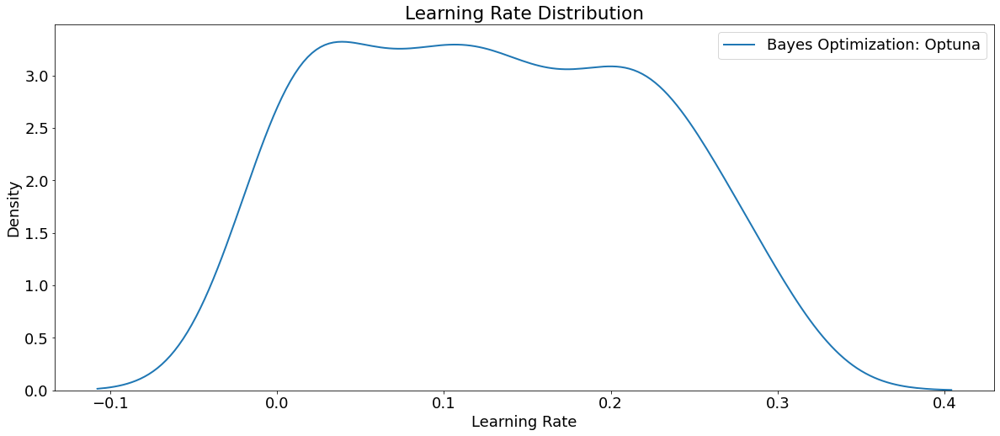

In [ ]:
# Density plots of the learning rate distributions 
plt.figure(figsize=(20,8))
plt.rcParams['font.size'] = 18
sns.kdeplot(trials_df['learning_rate'], label='Bayes Optimization: Optuna', 
            linewidth=2)
plt.legend(loc=1)
plt.xlabel('Learning Rate'); plt.ylabel('Density'); plt.title('Learning Rate Distribution');
plt.show()

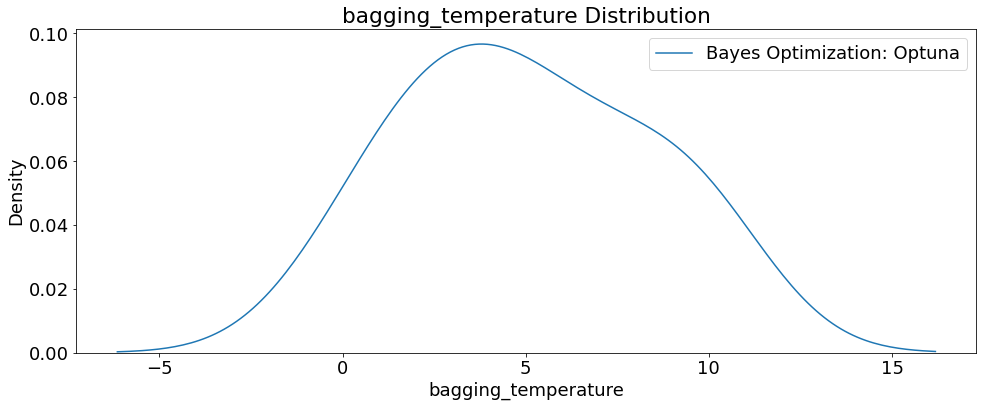

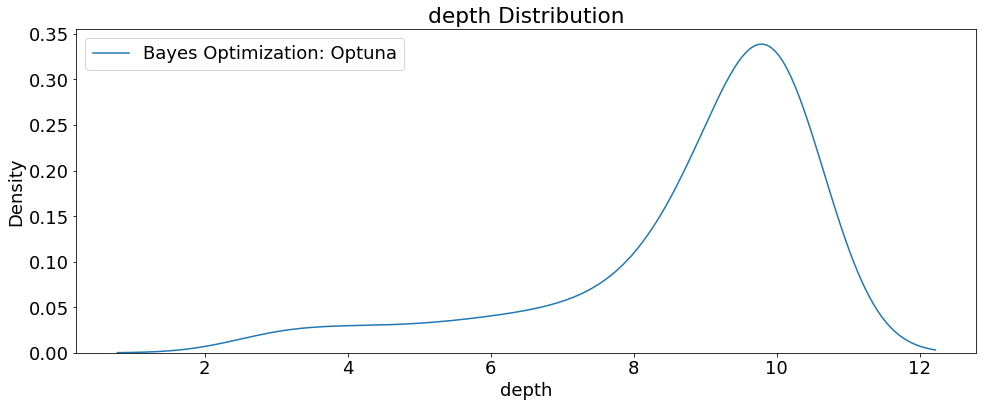

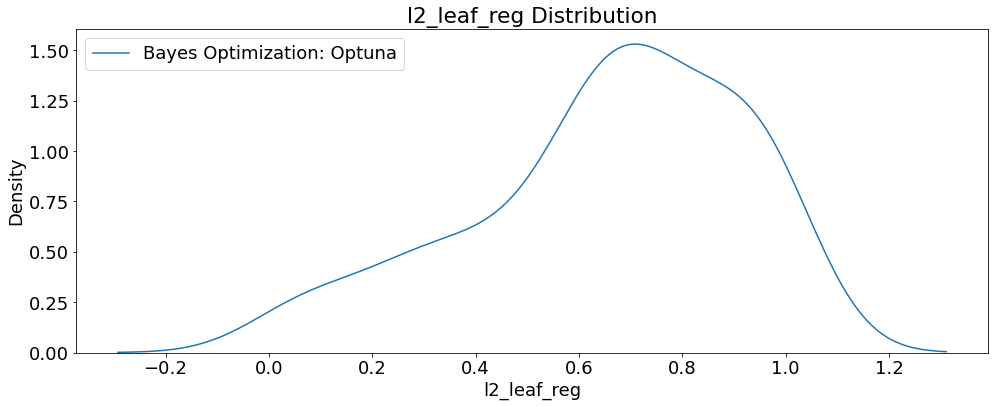

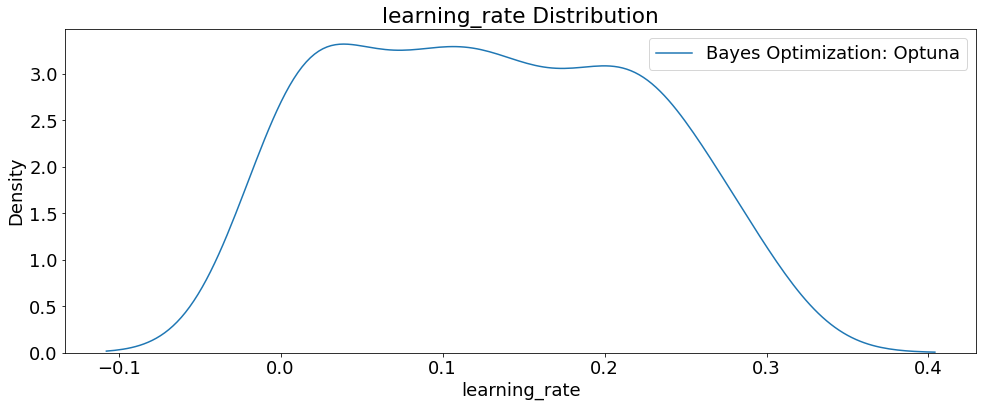

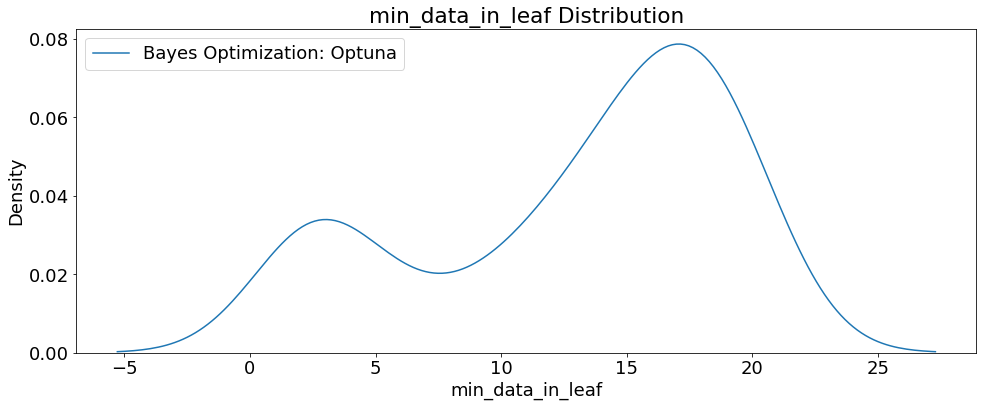

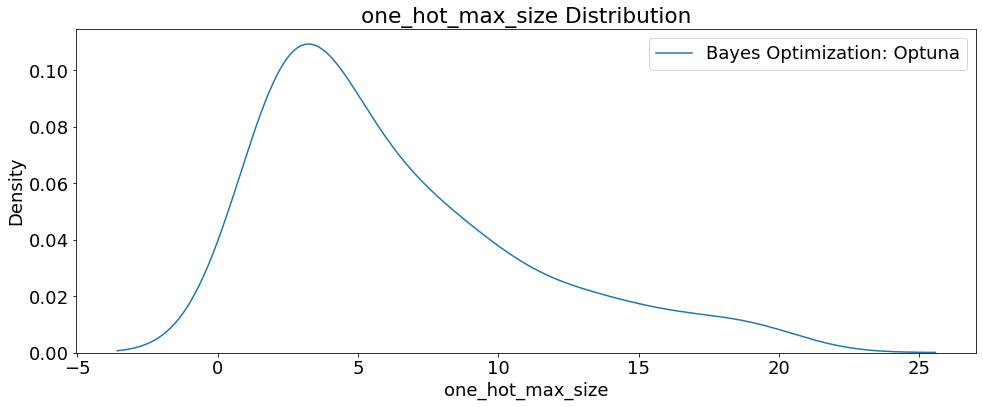

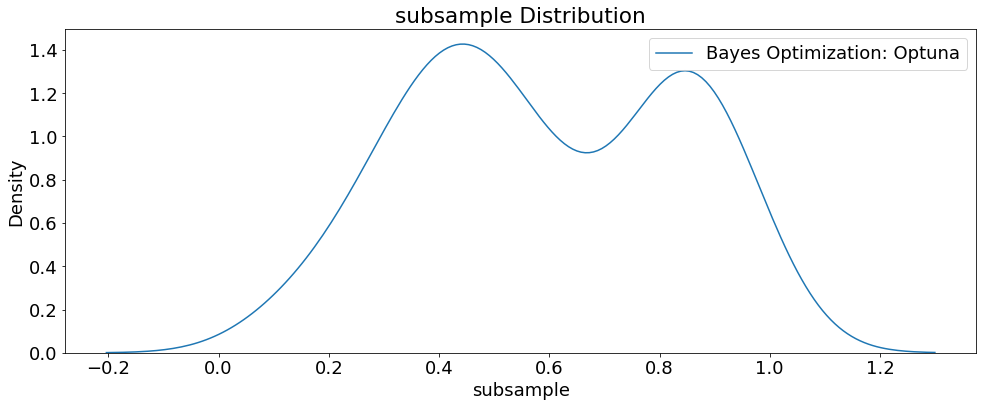

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration','n_estimators', 'state', 'boosting_type',
                   'bootstrap_type']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

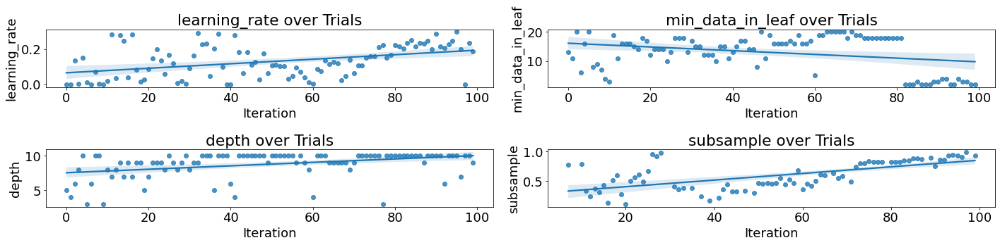

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(2, 2, figsize=(20,5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['learning_rate', 'min_data_in_leaf', 
                         'depth', 'subsample']):
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo),  
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

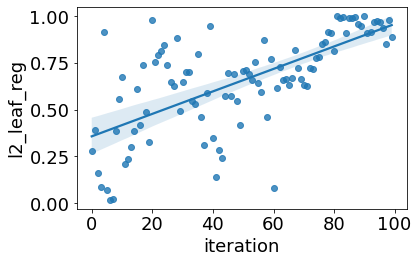

In [ ]:
# Scatterplot of regularization hyperparameters
ax = sns.regplot(x='iteration', y='l2_leaf_reg', data=trials_df)
plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Catboost_Optuna_100_GPU_CV_wb.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Catboost_Optuna_100_GPU_CV_wb.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params   
params['random_state'] = seed_value
params

{'n_estimators': 420,
 'learning_rate': 0.22580679060699685,
 'depth': 10,
 'l2_leaf_reg': 0.9688515878473537,
 'min_data_in_leaf': 2,
 'one_hot_max_size': 2,
 'boosting_type': 'Plain',
 'bootstrap_type': 'Bernoulli',
 'subsample': 0.9251993161835224,
 'random_state': 42}

In [ ]:
# Set up label and features
train_label = trainDF[['price']]
test_label = testDF[['price']]

train_features = trainDF.drop(columns = ['price'])
test_features = testDF.drop(columns = ['price'])

# Set categorical variables for Catboost
categorical_features_indices = np.where(train_features.dtypes != np.float)[0]

In [ ]:
# Re-create the best model and train on the training data
best_bayes_model = CatBoostRegressor(loss_function='RMSE', 
                                     task_type='GPU', 
                                     cat_features=categorical_features_indices, 
                                     early_stopping_rounds=10, 
                                     rsm=1, 
                                     logging_level='Silent', 
                                     **params)

# Fit the model
best_bayes_model.fit(train_features, train_label)

# Save model
Pkl_Filename = 'Catboost_Optuna_trials100_GPU_CV_wb.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_bayes_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Catboost_Optuna_trials100_GPU_CV_wb.pkl')
# print(model)
# =============================================================================

In [ ]:
# Create test features
categorical_features_indices = np.where(test_features.dtypes != np.float)[0]

In [ ]:
print('\nModel Metrics for Catboost HPO 100 GPU trials')
y_train_pred = best_model.predict(train_features)
y_test_pred = best_model.predict(test_features)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(train_label, y_train_pred),
        mean_absolute_error(test_label, y_test_pred)))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(train_label, y_train_pred),
        mean_squared_error(test_label, y_test_pred)))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(train_label, y_train_pred, squared=False),
        mean_squared_error(test_label, y_test_pred, squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(train_label, y_train_pred),
        r2_score(test_label, y_test_pred)))


Model Metrics for Catboost HPO 100 GPU trials
MAE train: 1562.789, test: 1773.690
MSE train: 4414625.408, test: 5773327.348
RMSE train: 2101.101, test: 2402.775
R^2 train: 0.952, test: 0.937


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(test_label, 
                                                                                                      y_test_pred)))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 5773327.34790 MSE on the test set.
This was achieved using these conditions:
iteration                                      93
rmse                                  2430.953475
datetime_start         2022-12-27 05:26:15.986259
datetime_complete      2022-12-27 05:27:38.642549
duration                   0 days 00:01:22.656290
bagging_temperature                           NaN
boosting_type                               Plain
bootstrap_type                          Bernoulli
depth                                          10
l2_leaf_reg                              0.968852
learning_rate                            0.225807
min_data_in_leaf                                2
n_estimators                                  420
one_hot_max_size                                2
subsample                                0.925199
state                                    COMPLETE
Name: 93, dtype: object


In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_Explanations/

/notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_Explanations


In [ ]:
# Define function for feature importance plot
def plot_feature_importance(importance, names, model_type):
    
    # Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)
    
    # Create a DataFrame using a Dictionary
    data={'feature_names': feature_names, 
          'feature_importance': feature_importance}
    fi_df = pd.DataFrame(data)
    
    # Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False, inplace=True)
    
    # Define size of bar plot
    plt.figure(figsize=(10,8))
    # Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'], 
                palette='cool')
    
    # Add chart labels
    plt.title(model_type + ' Feature Importance')
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature Names')

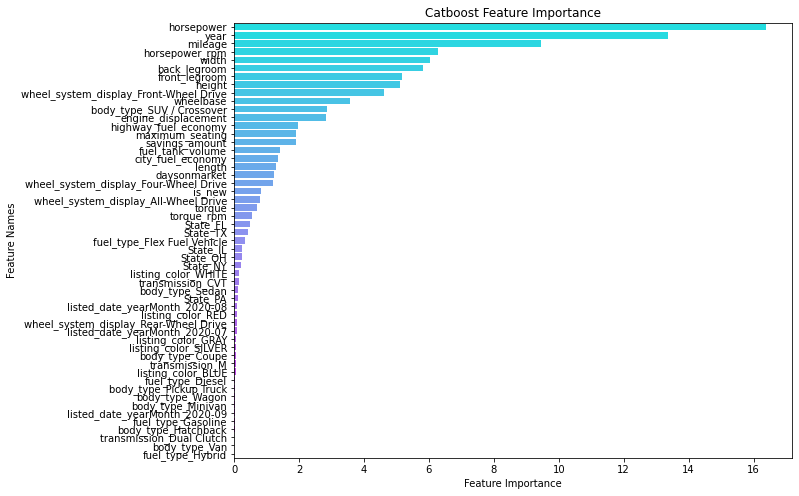

In [ ]:
# Plot the feature importance from best model result
plot_feature_importance(best_bayes_model.get_feature_importance(), 
                        train_features.columns, 'Catboost')
plt.savefig('Catboost_HPO_100_GPU_CV_wb_FeatureImportance.png', dpi=my_dpi*10, 
            bbox_inches='tight')

In [ ]:
# Define function for feature importance csv
def feature_importance(importance, names):
    
    # Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)
    
    # Create a DataFrame using a Dictionary
    data={'feature_names': feature_names, 
          'feature_importance': feature_importance}
    fi_df = pd.DataFrame(data)
    
    # Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False, inplace=True)
    fi_df.to_csv(a, index=False)

In [ ]:
# Save feature importance of best model
a = 'Catboost_HPO_100_GPU_CV_wb_FeatureImportance.csv'
feature_importance(best_bayes_model.get_feature_importance(), 
                   train_features.columns)

In [ ]:
# Training Set: Feature Importance Computed with SHAP Values
shap.initjs()
explainer = shap.TreeExplainer(best_bayes_model)
shap_values = explainer.shap_values(train_features)

<Figure size 432x288 with 0 Axes>

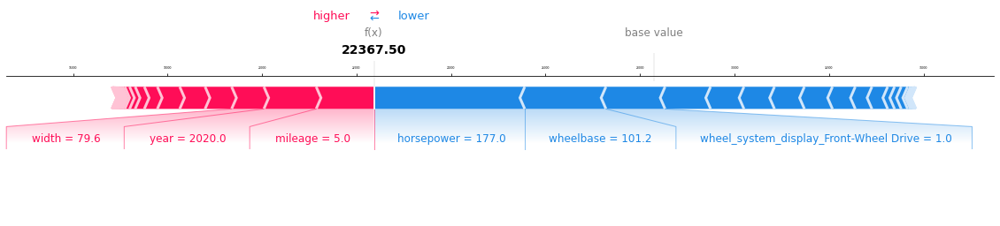

In [ ]:
# Visualize the first prediction's explanation
plt.rcParams.update({'font.size': 3})
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], train_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('Catboost_HPO_Optuna_100_GPU_CV_wb_ShapForcePlot_TrainSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

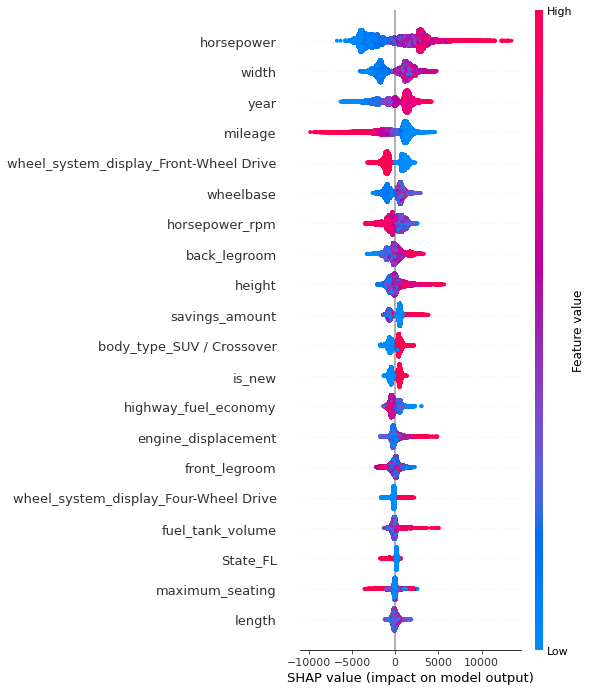

In [ ]:
# Training Set: Summarize the effects of all the features
shap.summary_plot(shap_values, train_features, show=False)
fig.savefig('Catboost_HPO_Optuna_100_GPU_CV_wb_ShapSummary_TrainSet.png', 
            dpi=my_dpi*10, bbox_inches='tight');

In [ ]:
# Test Set: Feature Importance Computed with SHAP Values
shap.initjs()
shap_values = explainer.shap_values(test_features)

<Figure size 432x288 with 0 Axes>

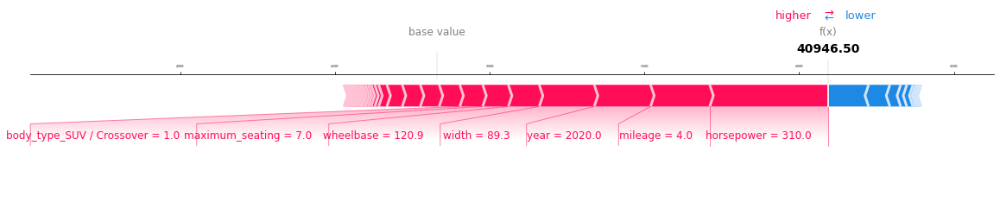

In [ ]:
# Visualize the first prediction's explanation
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], test_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('Catboost_HPO_Optuna_100_GPU_CV_wb_ShapForcePlot_TestSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

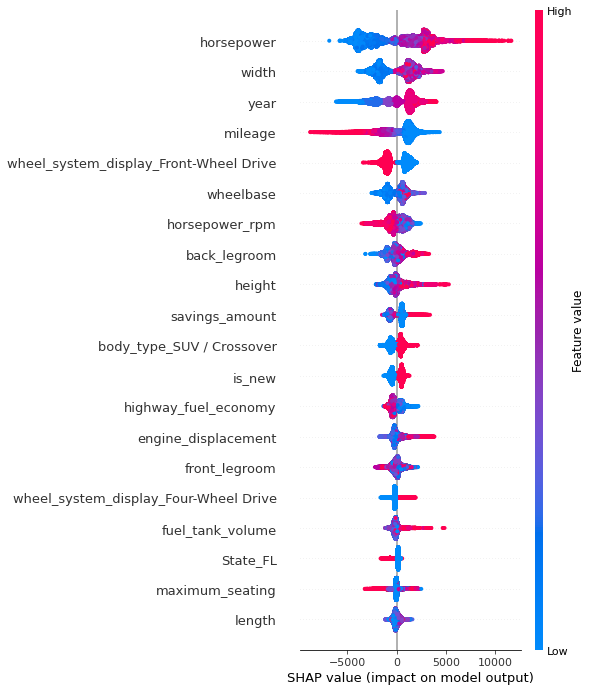

In [ ]:
# Test Set: Summarize the effects of all the features
shap.summary_plot(shap_values, test_features, show=False)
fig.savefig('Catboost_HPO_Optuna_100_GPU_CV_wb_ShapSummary_TestSet.png', 
            dpi=my_dpi*10, bbox_inches='tight');

## 100 Trials Train/Validation/Test 

In [ ]:
# Set up train/test split
X_train, X_val, y_train, y_val = train_test_split(train_features, train_label, 
                                                  test_size=0.2,
                                                  random_state=seed_value)

In [ ]:
# Define label and features
train_features = X_train
train_label = y_train

val_features = X_val
val_label = y_val

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_PKL

/notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_PKL


In [ ]:
# Set up wandb
wandb.login()

wandb_kwargs = {'project': 'usedCars_hpo', 'entity': 'aschultz', 
                'group': 'optuna_cat100gpu_trainValTest', 
                'save_code': 'False', 'notes': 'optuna_trainValTest'}
wandbc = WeightsAndBiasesCallback(wandb_kwargs=wandb_kwargs, as_multirun=True)

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
# Set up WB callbacks
@wandbc.track_in_wandb()

# Define a function for optimization of hyperparameters
def objective(trial):
    """
    Objective function to tune a `CatBoostRegressor` model.
    """
    joblib.dump(study, 'Cat_Optuna_100_GPU_wb_trainValTest.pkl')

# Define parameter grid
    catboost_tune_kwargs = {
        'random_state': seed_value,
        'task_type':'GPU',
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 0.3),       
        'depth': trial.suggest_int('depth', 3, 10),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-2, 1e0),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 2, 20),
        'one_hot_max_size': trial.suggest_int('one_hot_max_size', 2, 20), 
        'boosting_type': trial.suggest_categorical('boosting_type', 
                                                   ['Ordered', 'Plain']),
        'bootstrap_type': trial.suggest_categorical('bootstrap_type', 
                                                    ['Bayesian', 'Bernoulli', 
                                                     'MVS'])
        }   

    # Conditional Hyperparameters
    if catboost_tune_kwargs['bootstrap_type'] == 'Bayesian':
      catboost_tune_kwargs['bagging_temperature'] = trial.suggest_float('bagging_temperature', 
                                                                        0, 10)
    elif catboost_tune_kwargs['bootstrap_type'] == 'Bernoulli':
      catboost_tune_kwargs['subsample'] = trial.suggest_float('subsample', 0.1, 1)
    
    # Define model type
    model = CatBoostRegressor(
        loss_function='RMSE', 
        cat_features=categorical_features_indices,
        early_stopping_rounds=10,
        rsm=1, 
        logging_level='Silent',
        **catboost_tune_kwargs)

    # Start timer for each trial
    start = timer()
    
    # Train the model
    model.fit(train_features, train_label.values.ravel(), 
              eval_set=[(val_features, val_label.values.ravel())])    
    run_time = timer() - start

    # Predictions
    y_pred_val = model.predict(val_features)
    rmse = mean_squared_error(val_label, y_pred_val, squared=False)

    print('- Trial RMSE:', rmse)  
    
    return rmse

In [ ]:
# Begin HPO trials 
# Start timer for experiment
start_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
if os.path.isfile('Cat_Optuna_100_GPU_wb_trainValTest.pkl'):
    study = joblib.load('Cat_Optuna_100_GPU_wb_trainValTest.pkl')
else:
    study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100, callbacks=[wandbc])

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)
wandb.finish()

wandb: Currently logged in as: aschultz. Use `wandb login --relogin` to force relogin


Start Time           2022-12-27 16:12:04.450623


- Trial RMSE: 3887.9752487682335


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 9018.712857881326


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2937.6584205627632


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,1.78044
boosting_type,Ordered


- Trial RMSE: 9083.185875370067


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,4.97392
boosting_type,Plain


- Trial RMSE: 4439.682765065421


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,3.83495
boosting_type,Plain


- Trial RMSE: 8993.38280322125


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,9.3563
boosting_type,Ordered


- Trial RMSE: 3663.242841734498


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 9223.780723336145


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2938.867466616233


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 8560.491908432532


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 3348.091590893343


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,3


- Trial RMSE: 2768.1475712917795


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 2734.1723268334763


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 2760.9007025397314


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 2892.172668216086


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 9582.428784774009


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,9


- Trial RMSE: 2755.54931258415


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 2920.273478188618


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,9


- Trial RMSE: 9582.375582783689


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,3


- Trial RMSE: 2879.680756995688


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,8


- Trial RMSE: 9582.428999185246


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 2754.3800341379815


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 3139.1727880052613


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,9


- Trial RMSE: 9582.34352679296


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 2760.226121948574


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,9


- Trial RMSE: 2927.4784704396675


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 5107.632209615217


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,8


- Trial RMSE: 3020.578637512008


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,6


- Trial RMSE: 9582.344661851052


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,9


- Trial RMSE: 4830.46633348633


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,9.50258
boosting_type,Plain


- Trial RMSE: 9582.134895212745


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,6


- Trial RMSE: 2754.5155123456157


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,9


- Trial RMSE: 2754.1437909881406


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 2898.0626508206824


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,9


- Trial RMSE: 3080.644147770845


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,MVS
depth,10


- Trial RMSE: 2813.973923815221


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,0.27138
boosting_type,Plain


- Trial RMSE: 2838.5929750590185


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,MVS
depth,10


- Trial RMSE: 7906.667684950711


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 3586.8795049985897


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,6.83672
boosting_type,Plain


- Trial RMSE: 4162.550731136608


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,MVS
depth,7


- Trial RMSE: 2592.2088597077714


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2594.2983884718287


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2578.996432091432


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2668.1021224695787


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2718.6886489096164


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2742.77774757323


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2802.519832198249


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2649.7099070523195


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2591.798461483166


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2654.0943513319257


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Plain
bootstrap_type,Bernoulli


- Trial RMSE: 2620.143199790852


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2618.4875465550867


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2621.765331492549


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2668.37095481224


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2774.5924986841906


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2628.7883982710737


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 4790.858816270382


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2636.8535064666735


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 3143.2259231594808


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2660.5762437074386


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2602.5082024826843


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2597.278425692858


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2583.0630445601796


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2634.8286854513135


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2554.352670114288


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2561.3722544991815


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2564.6623115378266


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2565.102828025643


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2569.437869981463


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2556.5526051602455


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2560.00551779927


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2568.9610235724826


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2563.066802939845


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2568.194871546687


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2930.6814040930785


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,7.09429
boosting_type,Ordered


- Trial RMSE: 2571.062428620413


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 9213.466610761481


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2551.030988347363


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 8514.580493894164


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2630.777952063228


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2682.430183004635


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,2.937
boosting_type,Ordered


- Trial RMSE: 2573.712453306485


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2582.2710132000057


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2553.7647073236076


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2584.3119317353144


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2568.719930788203


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2594.776405095007


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2573.2976042217947


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2550.1959489884207


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2678.33979742319


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2565.003248354342


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2561.7121565867965


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2573.513917302306


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2606.677327789759


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2830.541717675915


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2564.634642564931


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2572.299719534516


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 2601.21783074832


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


- Trial RMSE: 6084.004634122714


bagging_temperature,▁
depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
trial_number,▁
value,▁
bagging_temperature,7.04209
boosting_type,Ordered


- Trial RMSE: 3224.3475106180595


depth,▁
l2_leaf_reg,▁
learning_rate,▁
min_data_in_leaf,▁
n_estimators,▁
one_hot_max_size,▁
subsample,▁
trial_number,▁
value,▁
boosting_type,Ordered
bootstrap_type,Bernoulli


Start Time           2022-12-27 16:12:04.450623
End Time             2022-12-27 17:14:04.366970
1:01:59


Number of finished trials: 100
Best trial: {'n_estimators': 279, 'learning_rate': 0.29565236170581577, 'depth': 10, 'l2_leaf_reg': 0.8118685571559361, 'min_data_in_leaf': 17, 'one_hot_max_size': 15, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6018510447803991}
Lowest RMSE 2550.1959489884207


In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/trialOptions/

/notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'}, inplace=True)
trials_df.rename(columns={'params_bagging_temperature': 'bagging_temperature'}, 
                 inplace=True)
trials_df.rename(columns={'params_boosting_type': 'boosting_type'}, 
                 inplace=True)
trials_df.rename(columns={'params_bootstrap_type': 'bootstrap_type'}, 
                 inplace=True)
trials_df.rename(columns={'params_depth': 'depth'}, inplace=True)
trials_df.rename(columns={'params_l2_leaf_reg': 'l2_leaf_reg'}, inplace=True)
trials_df.rename(columns={'params_learning_rate': 'learning_rate'}, 
                 inplace=True)
trials_df.rename(columns={'params_min_data_in_leaf': 'min_data_in_leaf'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df.rename(columns={'params_one_hot_max_size': 'one_hot_max_size'}, 
                 inplace=True)
trials_df.rename(columns={'params_subsample': 'subsample'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Catboost_Optuna_100_GPU_wb_trainValTest.csv', index=False)

    iteration         rmse             datetime_start  \
88         88  2550.195949 2022-12-27 17:03:17.201836   
77         77  2551.030988 2022-12-27 16:53:33.342722   
83         83  2553.764707 2022-12-27 16:58:32.946298   
64         64  2554.352670 2022-12-27 16:43:41.905268   
69         69  2556.552605 2022-12-27 16:47:28.851928   
..        ...          ...                        ...   
23         23  9582.343527 2022-12-27 16:21:00.375396   
28         28  9582.344662 2022-12-27 16:22:54.455686   
18         18  9582.375583 2022-12-27 16:19:17.163321   
15         15  9582.428785 2022-12-27 16:18:16.590569   
20         20  9582.428999 2022-12-27 16:19:57.492797   

            datetime_complete               duration  bagging_temperature  \
88 2022-12-27 17:03:45.616045 0 days 00:00:28.414209                  NaN   
77 2022-12-27 16:53:59.638327 0 days 00:00:26.295605                  NaN   
83 2022-12-27 16:59:09.685698 0 days 00:00:36.739400                  NaN   
64 2022

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_Explanations/

/notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Catboost_Optuna_100_GPU_wb_trainValTest.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Catboost_Optuna_100_GPU_wb_trainValTest.html')
fig.show()

[W 2022-12-27 17:14:04,955] Your study has only completed trials with missing parameters.


In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Catboost_Optuna_100_GPU_wb_trainValTest.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
fig = optuna.visualization.plot_contour(study, params=['depth', 
                                                       'subsample', 
                                                       'learning_rate', 
                                                       'subsample'])
py.plot(fig, filename='contour_Catboost_Optuna_100_GPU_wb_trainValTest.html')
fig.show()

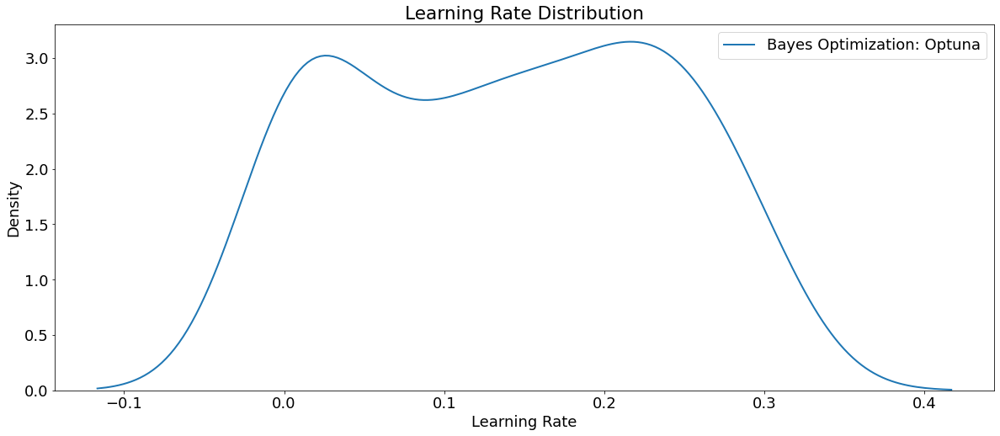

In [ ]:
# Density plots of the learning rate distributions 
plt.figure(figsize=(20,8))
plt.rcParams['font.size'] = 18
sns.kdeplot(trials_df['learning_rate'], label='Bayes Optimization: Optuna', 
            linewidth=2)
plt.legend(loc=1)
plt.xlabel('Learning Rate'); plt.ylabel('Density'); plt.title('Learning Rate Distribution');
plt.show()

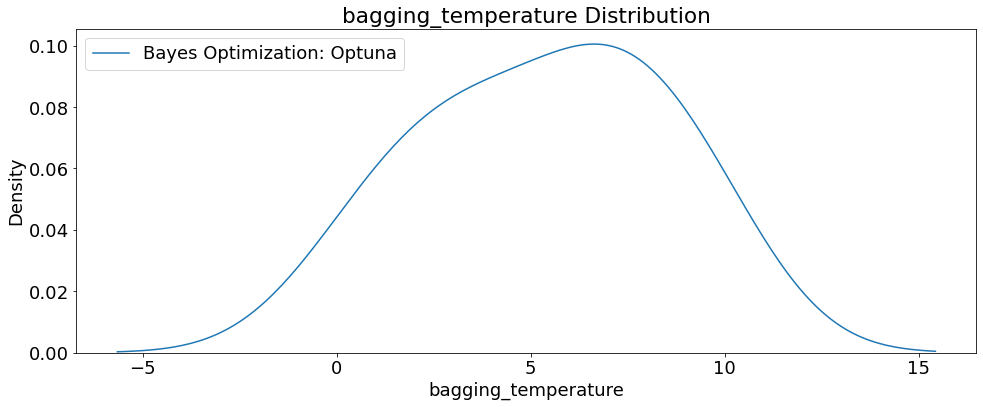

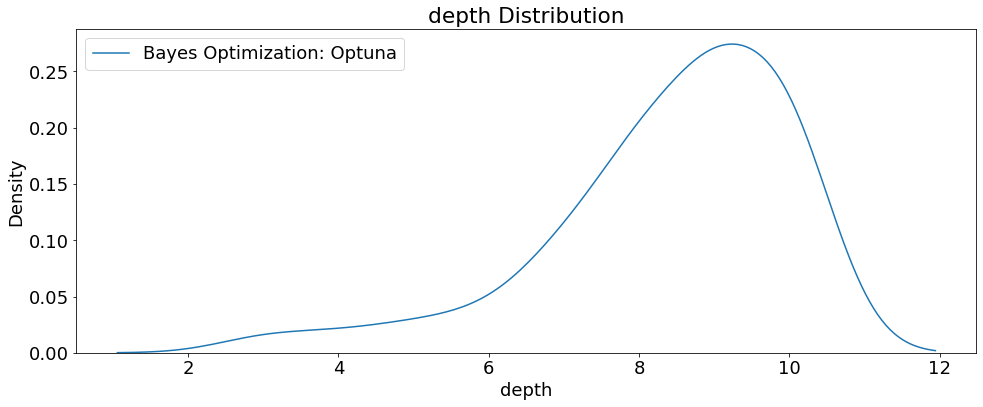

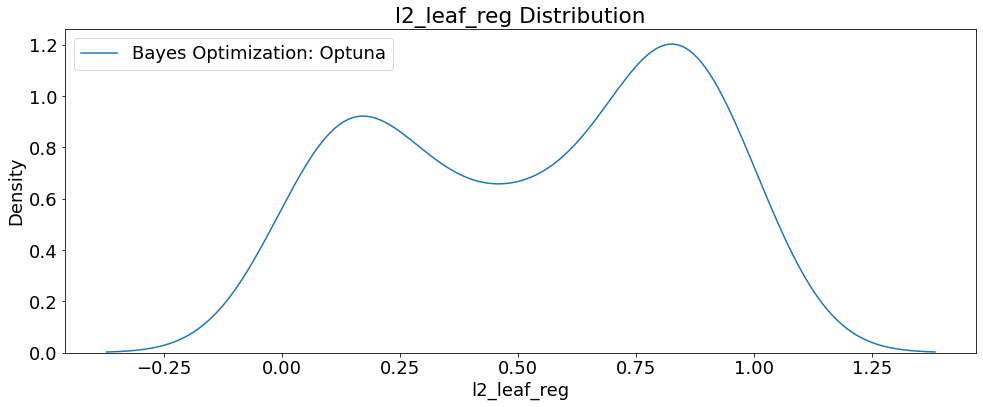

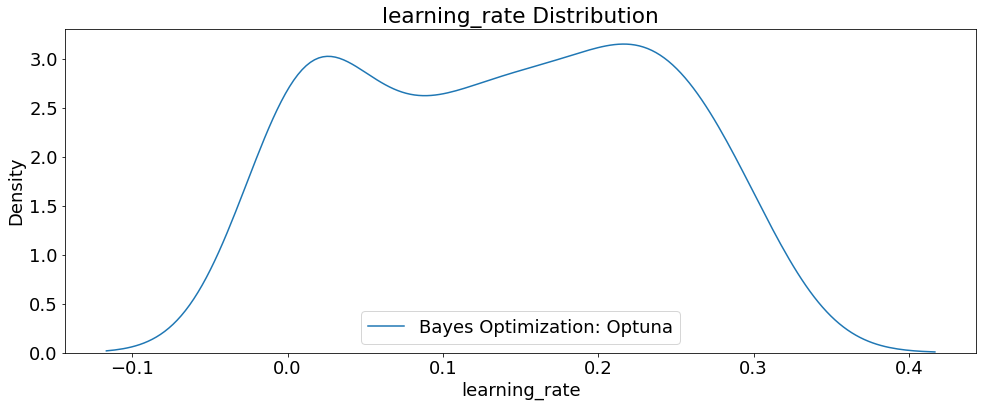

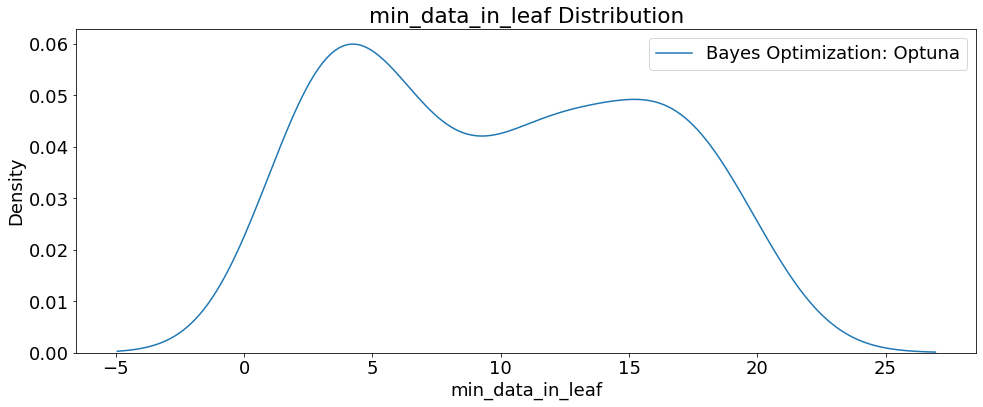

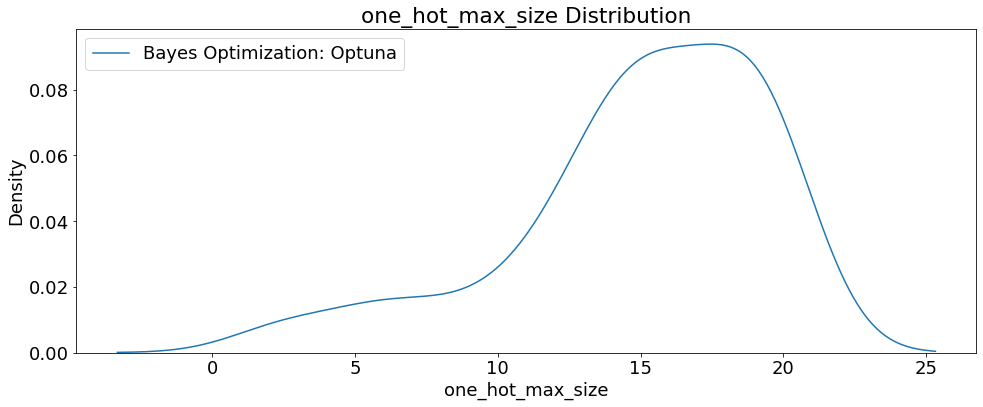

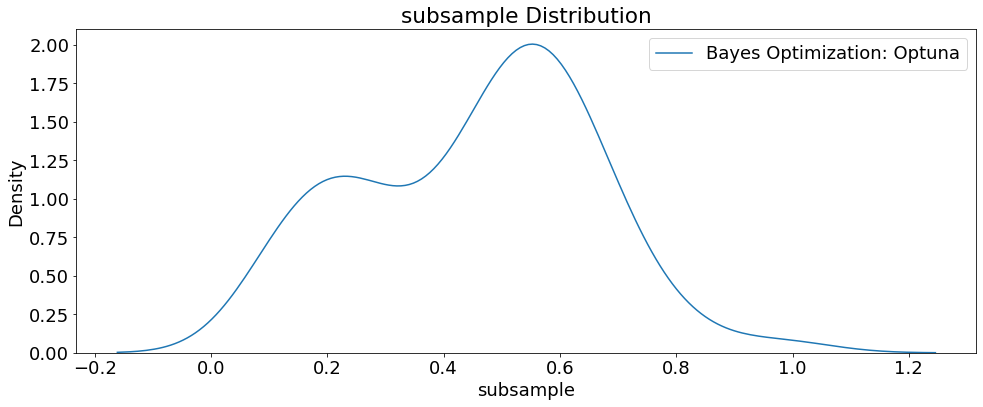

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration','n_estimators', 'state', 'boosting_type',
                   'bootstrap_type']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

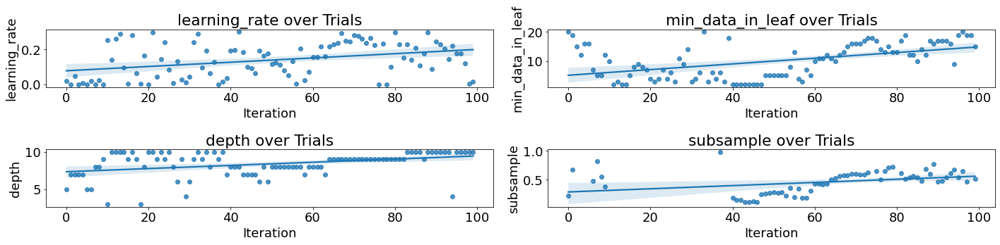

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(2, 2, figsize=(20,5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['learning_rate', 'min_data_in_leaf', 
                         'depth', 'subsample']):
  # Scatterplot
  sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
  axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo),  
             title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

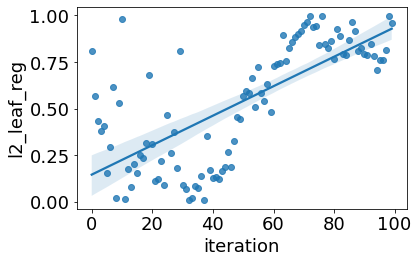

In [ ]:
# Scatterplot of regularization hyperparameters
ax = sns.regplot(x='iteration', y='l2_leaf_reg', data=trials_df)
plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Catboost_Optuna_100_GPU_wb_trainValTest.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Catboost_Optuna_100_GPU_wb_trainValTest.html')
fig.show()

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_PKL/

/notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_PKL


In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params   
params['random_state'] = seed_value
params

{'n_estimators': 279,
 'learning_rate': 0.29565236170581577,
 'depth': 10,
 'l2_leaf_reg': 0.8118685571559361,
 'min_data_in_leaf': 17,
 'one_hot_max_size': 15,
 'boosting_type': 'Ordered',
 'bootstrap_type': 'Bernoulli',
 'subsample': 0.6018510447803991,
 'random_state': 42}

In [ ]:
# Set up label and features
train_label = trainDF[['price']]
test_label = testDF[['price']]

train_features = trainDF.drop(columns = ['price'])
test_features = testDF.drop(columns = ['price'])

# Set categorical variables for Catboost
categorical_features_indices = np.where(train_features.dtypes != np.float)[0]

In [ ]:
# Re-create the best model and train on the training data
best_bayes_model = CatBoostRegressor(loss_function='RMSE', 
                                     task_type='GPU', 
                                     cat_features=categorical_features_indices, 
                                     early_stopping_rounds=10, 
                                     rsm=1, 
                                     logging_level='Silent', 
                                     **params)

# Fit the model
best_bayes_model.fit(train_features, train_label)

# Save model
Pkl_Filename = 'Catboost_Optuna_trials100_GPU_wb_trainValTest.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_bayes_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Catboost_Optuna_trials100_GPU_wb_trainValTest.pkl')
# print(model)
# =============================================================================

In [ ]:
# Create test features
categorical_features_indices = np.where(test_features.dtypes != np.float)[0]

In [ ]:
print('\nModel Metrics for Catboost HPO 100 GPU trials')
y_train_pred = best_bayes_model.predict(train_features)
y_test_pred = best_bayes_model.predict(test_features)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(train_label, y_train_pred),
        mean_absolute_error(test_label, y_test_pred)))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(train_label, y_train_pred),
        mean_squared_error(test_label, y_test_pred)))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(train_label, y_train_pred, squared=False),
        mean_squared_error(test_label, y_test_pred, squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(train_label, y_train_pred),
        r2_score(test_label, y_test_pred)))


Model Metrics for Catboost HPO 100 GPU trials
MAE train: 1838.481, test: 1871.857
MSE train: 6087248.195, test: 6313541.520
RMSE train: 2467.235, test: 2512.676
R^2 train: 0.934, test: 0.931


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(test_label, 
                                                                                                      y_test_pred)))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 6313541.51975 MSE on the test set.
This was achieved using these conditions:
iteration                                      88
rmse                                  2550.195949
datetime_start         2022-12-27 17:03:17.201836
datetime_complete      2022-12-27 17:03:45.616045
duration                   0 days 00:00:28.414209
bagging_temperature                           NaN
boosting_type                             Ordered
bootstrap_type                          Bernoulli
depth                                          10
l2_leaf_reg                              0.811869
learning_rate                            0.295652
min_data_in_leaf                               17
n_estimators                                  279
one_hot_max_size                               15
subsample                                0.601851
state                                    COMPLETE
Name: 88, dtype: object


In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_Explanations/

/notebooks/UsedCarsCarGurus/Models/ML/Catboost/Optuna/Model_Explanations


In [ ]:
# Define function for feature importance plot
def plot_feature_importance(importance, names, model_type):
    
    # Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)
    
    # Create a DataFrame using a Dictionary
    data={'feature_names': feature_names, 
          'feature_importance': feature_importance}
    fi_df = pd.DataFrame(data)
    
    # Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False, inplace=True)
    
    # Define size of bar plot
    plt.figure(figsize=(10,8))
    # Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'], 
                palette='cool')
    
    # Add chart labels
    plt.title(model_type + ' Feature Importance')
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature Names')

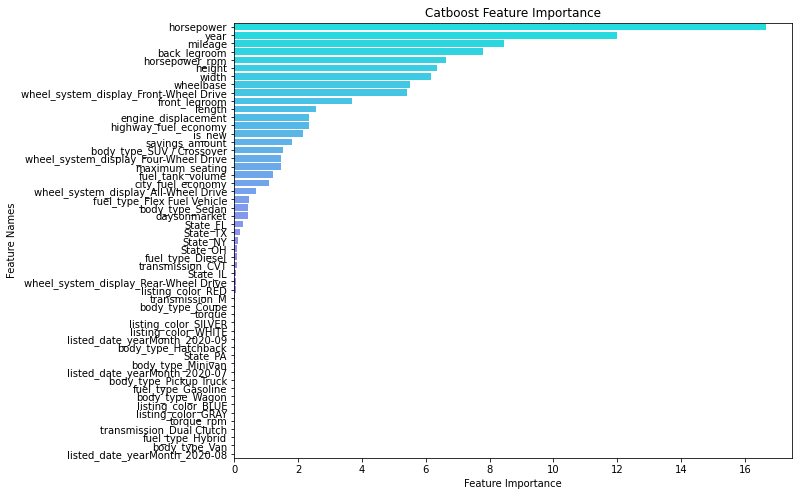

In [ ]:
# Plot the feature importance from best model result
plt.rcParams.update({'font.size': 10})
plot_feature_importance(best_bayes_model.get_feature_importance(), 
                        train_features.columns, 'Catboost')
plt.savefig('Catboost_HPO_100_GPU_wb_trainValTest_FeatureImportance.png', 
            dpi=my_dpi*10, bbox_inches='tight')

In [ ]:
# Define function for feature importance csv
def feature_importance(importance, names):
    
    # Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)
    
    # Create a DataFrame using a Dictionary
    data={'feature_names': feature_names, 
          'feature_importance': feature_importance}
    fi_df = pd.DataFrame(data)
    
    # Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False, inplace=True)
    fi_df.to_csv(a, index=False)

In [ ]:
# Save feature importance of best model
a = 'Catboost_HPO_100_GPU_wb_trainValTest_FeatureImportance.csv'
feature_importance(best_bayes_model.get_feature_importance(), 
                   train_features.columns)

In [ ]:
# Training Set: Feature Importance Computed with SHAP Values
shap.initjs()
explainer = shap.TreeExplainer(best_bayes_model)
shap_values = explainer.shap_values(train_features)

<Figure size 432x288 with 0 Axes>

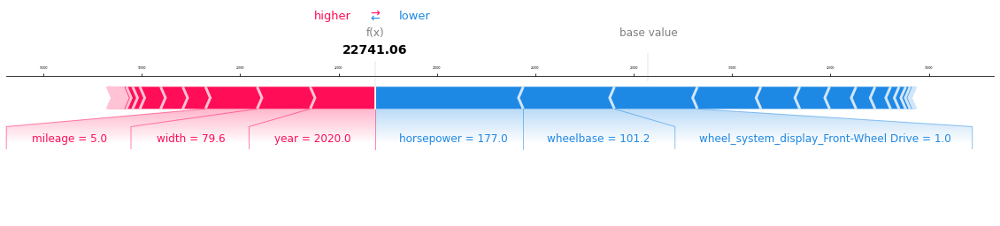

In [ ]:
# Visualize the first prediction's explanation
plt.rcParams.update({'font.size': 3})
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], train_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('Catboost_HPO_Optuna_100_GPU_wb_trainValTest_ShapForcePlot_TrainSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

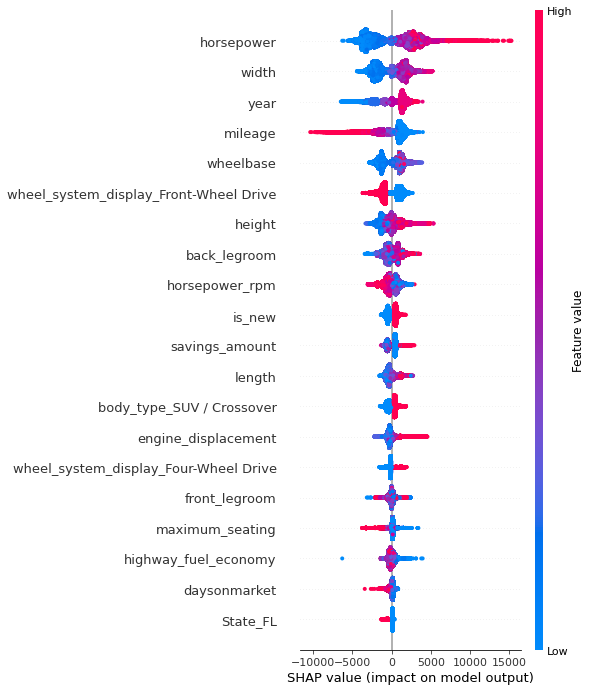

In [ ]:
# Training Set: Summarize the effects of all the features
shap.summary_plot(shap_values, train_features, show=False)
fig.savefig('Catboost_HPO_Optuna_100_GPU_wb_trainValTest_ShapSummary_TrainSet.png', 
            dpi=my_dpi*10, bbox_inches='tight');

In [ ]:
# Test Set: Feature Importance Computed with SHAP Values
shap.initjs()
shap_values = explainer.shap_values(test_features)

<Figure size 432x288 with 0 Axes>

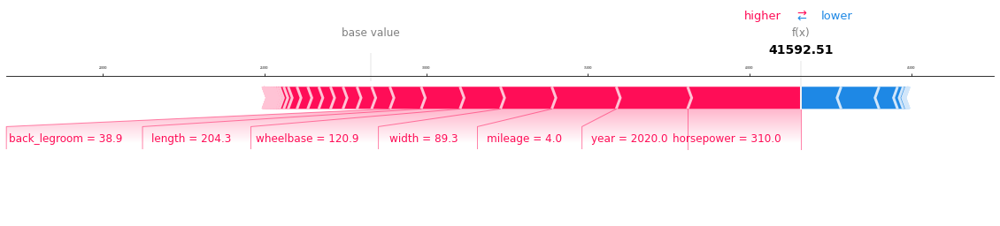

In [ ]:
# Visualize the first prediction's explanation
fig = plt.figure()
shap.force_plot(explainer.expected_value, shap_values[0,:], test_features.iloc[0,:], 
                show=False, matplotlib=True).savefig('Catboost_HPO_Optuna_100_GPU_wb_trainValTest_ShapForcePlot_TestSet.png', 
                                                     dpi=my_dpi*10, 
                                                     bbox_inches='tight');

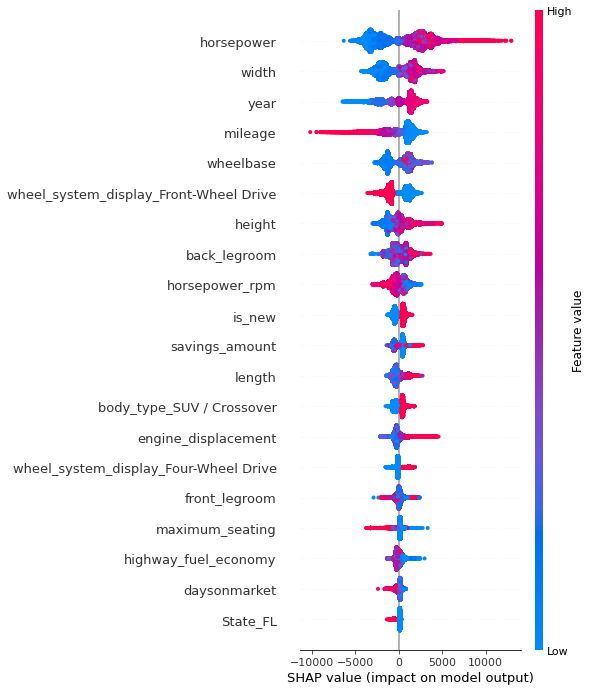

In [ ]:
# Test Set: Summarize the effects of all the features
shap.summary_plot(shap_values, test_features, show=False)
fig.savefig('Catboost_HPO_Optuna_100_GPU_wb_trainValTest_ShapSummary_TestSet.png', 
            dpi=my_dpi*10, bbox_inches='tight');